In [28]:
import os
import numpy as np 
import pandas as pd
import socket
import tissue_tag as tt
import matplotlib.pyplot as plt
import scanpy as sc
# output_notebook()
import matplotlib.pyplot as plt
from matplotlib import font_manager
font_manager.fontManager.addfont("")
print(font_manager.findfont("Arial"))
plt.rcParams["font.sans-serif"] = ["Arial"]
plt.rcParams["pdf.fonttype"] = 42

In [29]:
# load example fetal and paed datasets
path_fetal = 'WSSS_F_IMMsp11604688'
path_paed = 'TA11556493'
ibex_path = 'Sample_07'
os.chdir('')

In [3]:
# set color palette 

In [ ]:
import matplotlib.pyplot as plt
names = ["Cyclamen" ,"Dark grey","Orange peel","Duke blue" ,"Blue Green","Forest green" ,"Mauveine","Yellow"]
cl_map = ["#ff6699","#505050","#ff9900",'#330099',"#0099cc","#009900","#990099","#ffff00"]
colordict_htsa = {key: value for key, value in zip(names, cl_map)}
annotations = ['Artifacts', 'lymph',  'Medulla','Edge', 'Cortex','HC','PVS','vessels']
htsa_colormap = pd.DataFrame({'structure': annotations, 'color_names': names, 'color_map': cl_map})
htsa_colormap.set_index('structure',inplace=True)
htsa_colormap.to_csv('hsta_colormap.csv')
htsa_colormap

## load and transfer annotations to grid space - fetal

In [ ]:
df_fetal = tt.anno_to_grid(
    folder=path_fetal+'/tissue_annotations/',
    file_name = 'annotations_level_0',
    spot_diameter = 15,
    load_colors=True,
)

In [ ]:
df_fetal = df_fetal.iloc[np.where(df_fetal['annotations_level_0']!='unassigned')[0],:]

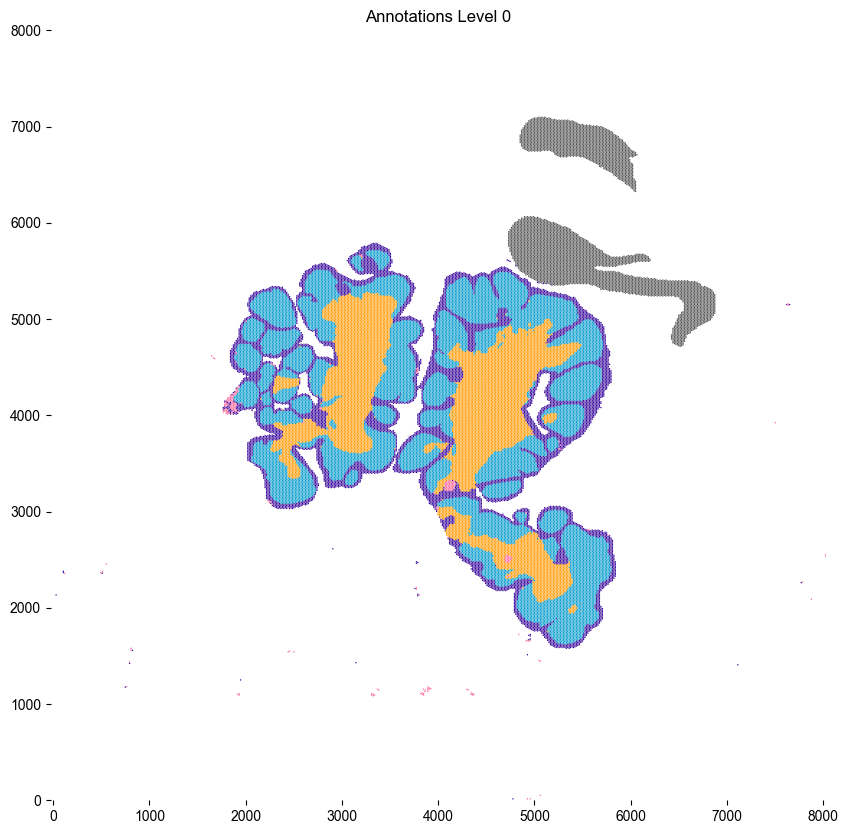

In [7]:
colors = df_fetal['annotations_level_0'].map(lambda x: htsa_colormap['color_map'][x])
plt.figure(dpi=100, figsize=[10,10])
plt.scatter(df_fetal['x'], df_fetal['y'], c=colors, s=1, marker='o', rasterized=True, edgecolors='none')
plt.title('Annotations Level 0')
plt.axis('equal')
plt.xlim((0,8000))
plt.ylim((0,8000))
for pos in ['right', 'top', 'bottom', 'left']:
    plt.gca().spines[pos].set_visible(False)
# Uncomment the next line to save the figure
plt.savefig('fetal_visium_example_anno_level_0.png', dpi=150)
plt.show()

In [ ]:
df_fetal = tt.anno_to_grid(
    folder=path_fetal+'/tissue_annotations/',
    file_name = 'annotations_level_1',
    spot_diameter = 15,
    load_colors=True,
)

In [144]:
df_fetal = df_fetal.iloc[np.where(df_fetal['annotations_level_1']!='unassigned')[0],:]

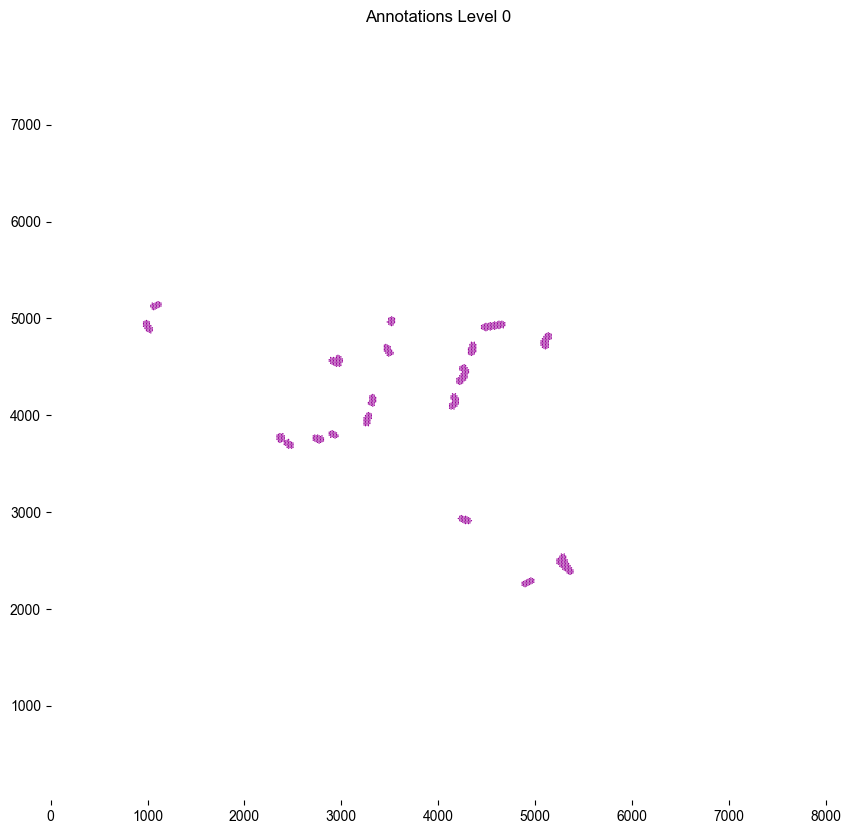

In [147]:
colors = df_fetal['annotations_level_1'].map(lambda x: htsa_colormap['color_map'][x])
plt.figure(dpi=100, figsize=[10,10])
plt.scatter(df_fetal['x'], df_fetal['y'], c=colors, s=1, marker='o', rasterized=True, edgecolors='none')
plt.title('Annotations Level 0')
plt.axis('equal')
plt.xlim((0,8000))
plt.ylim((0,8000))
for pos in ['right', 'top', 'bottom', 'left']:
    plt.gca().spines[pos].set_visible(False)
# Uncomment the next line to save the figure
plt.savefig('fetal_visium_example_anno_level_1.png', dpi=150)
plt.show()

## load and transfer annotations to grid space - paed


In [89]:
df_paed = tt.anno_to_grid(
    folder=path_paed+'/tissue_annotations/',
    file_name = 'annotations_level_0',
    spot_diameter = 15,
    load_colors=True,
)

loaded annotation image - annotations_level_0 size - (4121, 4644)
loaded annotations
{1: 'unassigned', 2: 'Cortex', 3: 'Medulla', 4: 'Edge', 5: 'Artifacts'}
loaded ppm
{'ppm': 0.5}
loaded color annotations
{'unassigned': 'yellow', 'Cortex': 'cyan', 'Medulla': 'green', 'Edge': 'brown', 'Artifacts': 'black'}
generating grid with spot size - 15, with resolution of - 0.5 ppm
annotations_level_0


340380it [00:43, 7770.95it/s]


In [90]:
# remove background spots if you are not interested in it!
df_paed = df_paed.iloc[np.where(df_paed['annotations_level_0']!='unassigned')[0],:]

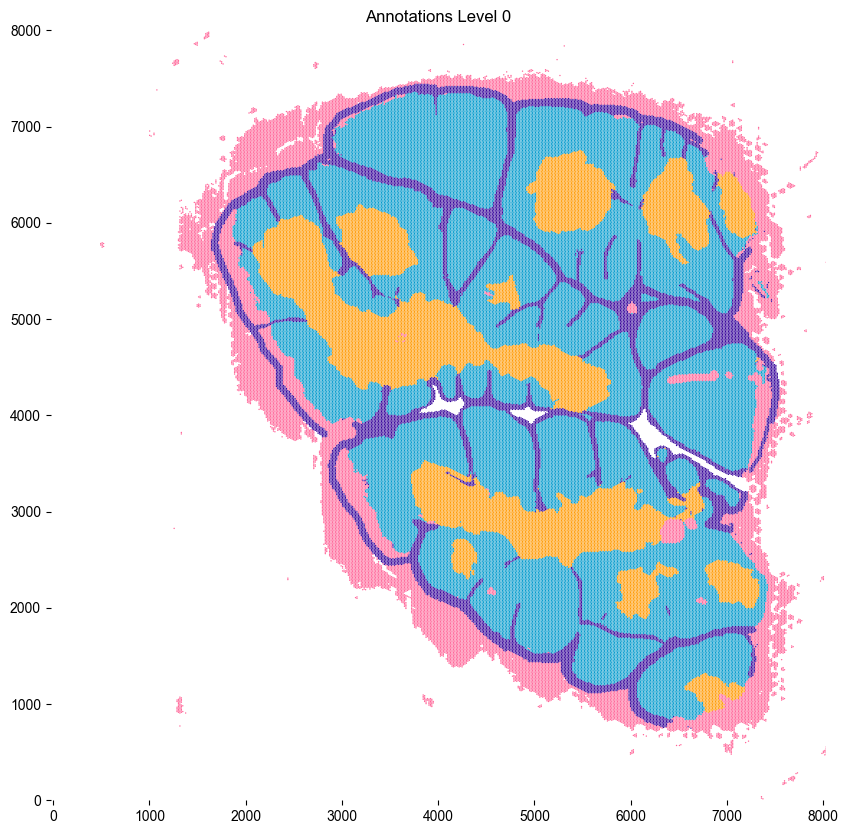

In [95]:
colors = df_paed['annotations_level_0'].map(lambda x: htsa_colormap['color_map'][x])
plt.figure(dpi=100, figsize=[10,10])
plt.scatter(df_paed['x'], df_paed['y'], c=colors, s=1, marker='o', rasterized=True, edgecolors='none')
plt.title('Annotations Level 0')
plt.axis('equal')
plt.xlim((0,8000))
plt.ylim((0,8000))
for pos in ['right', 'top', 'bottom', 'left']:
    plt.gca().spines[pos].set_visible(False)
# Uncomment the next line to save the figure
plt.savefig('paed_visium_example_anno_level_0.png', dpi=150)
plt.show()

In [115]:
df_paed = tt.anno_to_grid(
    folder=path_paed+'/tissue_annotations/',
    file_name = 'annotations_level_1',
    spot_diameter = 15,
    load_colors=True,
)

loaded annotation image - annotations_level_1 size - (4121, 4644)
loaded annotations
{1: 'unassigned', 2: 'PVS', 3: 'HS', 4: 'vessels', 5: 'fat'}
loaded ppm
{'ppm': 0.5}
loaded color annotations
{'unassigned': 'yellow', 'PVS': 'red', 'HS': 'magenta', 'vessels': 'blue', 'fat': 'black'}
generating grid with spot size - 15, with resolution of - 0.5 ppm
annotations_level_1


340380it [00:44, 7723.29it/s]


In [122]:
# remove background spots if you are not interested in it!
df_paed = df_paed.iloc[np.where(df_paed['annotations_level_1']!='unassigned')[0],:]
df_paed.loc[df_paed['annotations_level_1']=='HS','annotations_level_1'] = 'HC'

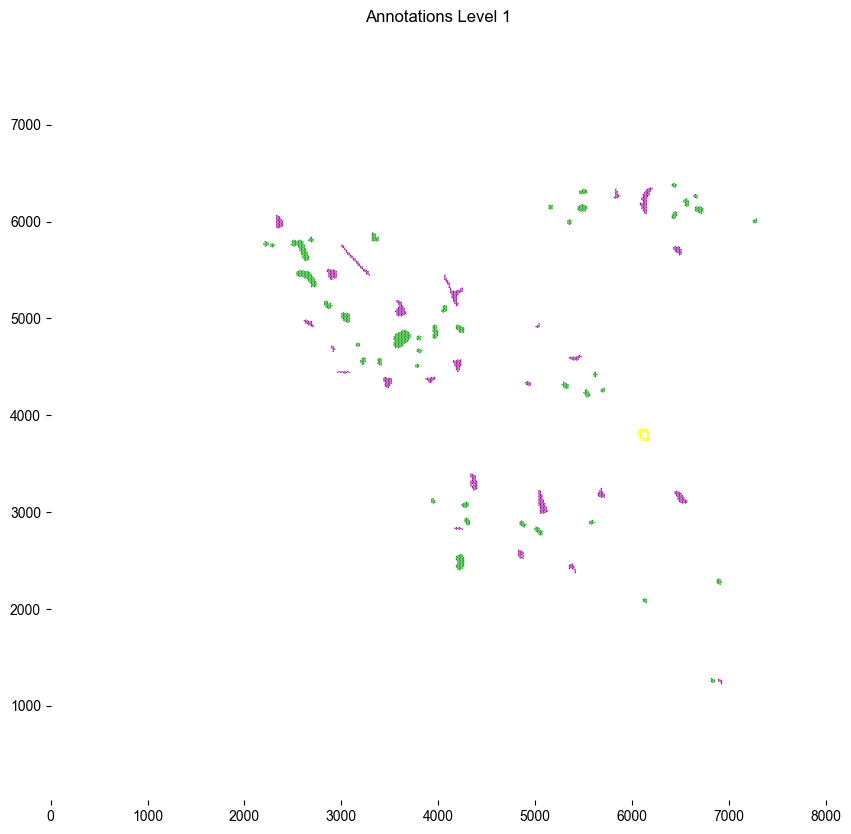

In [148]:
colors = df_paed['annotations_level_1'].map(lambda x: htsa_colormap['color_map'][x])
plt.figure(dpi=100, figsize=[10,10])
plt.scatter(df_paed['x'], df_paed['y'], c=colors, s=1, marker='o', rasterized=True, edgecolors='none')
plt.title('Annotations Level 1')
plt.axis('equal')
plt.xlim((0,8000))
plt.ylim((0,8000))
for pos in ['right', 'top', 'bottom', 'left']:
    plt.gca().spines[pos].set_visible(False)
# Uncomment the next line to save the figure
plt.savefig('paed_visium_example_anno_level_1.png', dpi=150)
plt.show()

## load and transfer annotations to grid space - paed IBEX


In [151]:
df_ibex = tt.anno_to_grid(
    folder=ibex_path+'/tissue_annotations/',
    file_name = 'annotation_lv_0',
    spot_diameter = 15,
    load_colors=True,
)

loaded annotation image - annotation_lv_0 size - (2232, 2238)
loaded annotations
{1: 'unassigned', 2: 'Artifacts', 3: 'Medulla', 4: 'Cortex', 5: 'Edge', 6: 'HS', 7: 'Vessels', 8: 'PVS', 9: 'Other'}
loaded ppm
{'ppm': 0.5}
loaded color annotations
{'unassigned': 'yellow', 'Artifacts': 'black', 'Medulla': 'green', 'Cortex': 'cyan', 'Edge': 'brown', 'HS': 'magenta', 'Vessels': 'blue', 'PVS': 'red', 'Other': 'orange'}
generating grid with spot size - 15, with resolution of - 0.5 ppm
annotation_lv_0


88804it [00:11, 7629.57it/s]


In [84]:
# remove background spots if you are not interested in it!
df_ibex = df_ibex.iloc[np.where(df_ibex['annotation_lv_0']!='unassigned')[0],:]

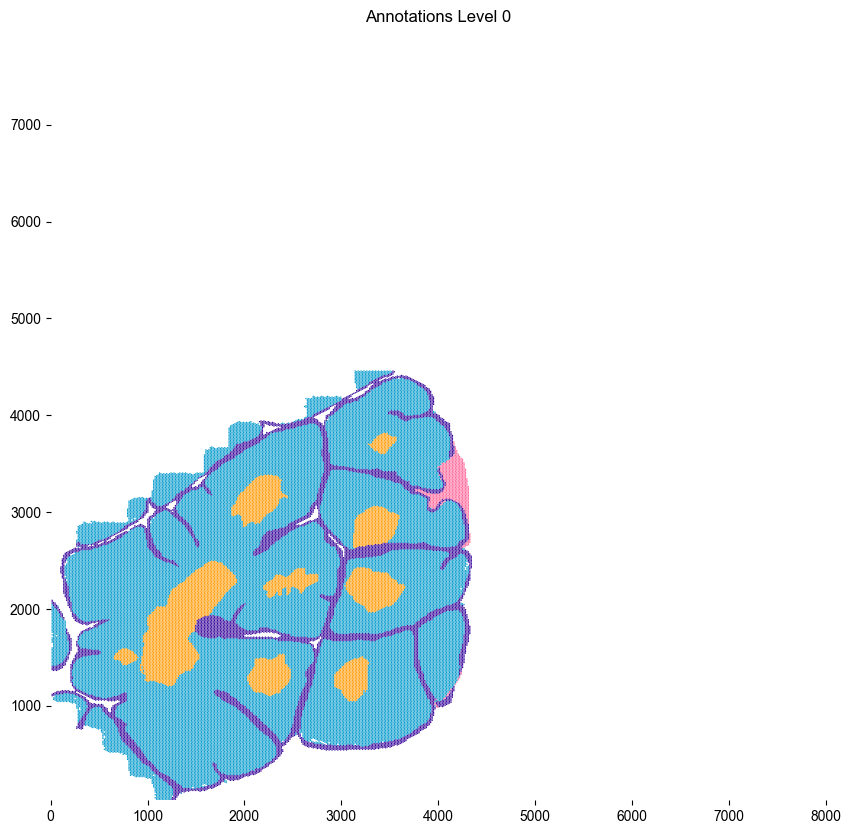

In [93]:
colors = df_ibex['annotation_lv_0'].map(lambda x: htsa_colormap['color_map'][x])
plt.figure(dpi=100, figsize=[10,10])
plt.scatter(df_ibex['x'], df_ibex['y'], c=colors, s=1, marker='o', rasterized=True, edgecolors='none')
plt.title('Annotations Level 0')
plt.axis('equal')
plt.xlim((0,8000))
plt.ylim((0,8000))

for pos in ['right', 'top', 'bottom', 'left']:
    plt.gca().spines[pos].set_visible(False)
# Uncomment the next line to save the figure
plt.savefig('paed_ibex_example_anno_level_0.png', dpi=150)
plt.show()

In [129]:
df_ibex = tt.anno_to_grid(
    folder=ibex_path+'/tissue_annotations/',
    file_name = 'annotation_lv_1',
    spot_diameter = 15,
    load_colors=True,
)

loaded annotation image - annotation_lv_1 size - (2232, 2238)
loaded annotations
{1: 'unassigned', 2: 'Artifacts', 3: 'Medulla', 4: 'Cortex', 5: 'Edge', 6: 'HS', 7: 'Vessels', 8: 'PVS', 9: 'Other'}
loaded ppm
{'ppm': 0.5}
loaded color annotations
{'unassigned': 'yellow', 'Artifacts': 'black', 'Medulla': 'green', 'Cortex': 'cyan', 'Edge': 'brown', 'HS': 'magenta', 'Vessels': 'blue', 'PVS': 'red', 'Other': 'orange'}
generating grid with spot size - 15, with resolution of - 0.5 ppm
annotation_lv_1


88804it [00:13, 6697.94it/s]


In [140]:
# remove background spots if you are not interested in it!
df_ibex = df_ibex.iloc[np.where(df_ibex['annotation_lv_1']!='unassigned')[0],:]
df_ibex.loc[df_ibex['annotation_lv_1']=='HS','annotation_lv_1'] = 'HC'
df_ibex.loc[df_ibex['annotation_lv_1']=='Vessels','annotation_lv_1'] = 'vessels'
df_ibex = df_ibex.iloc[np.where(df_ibex['annotation_lv_1']!='Other')[0],:]


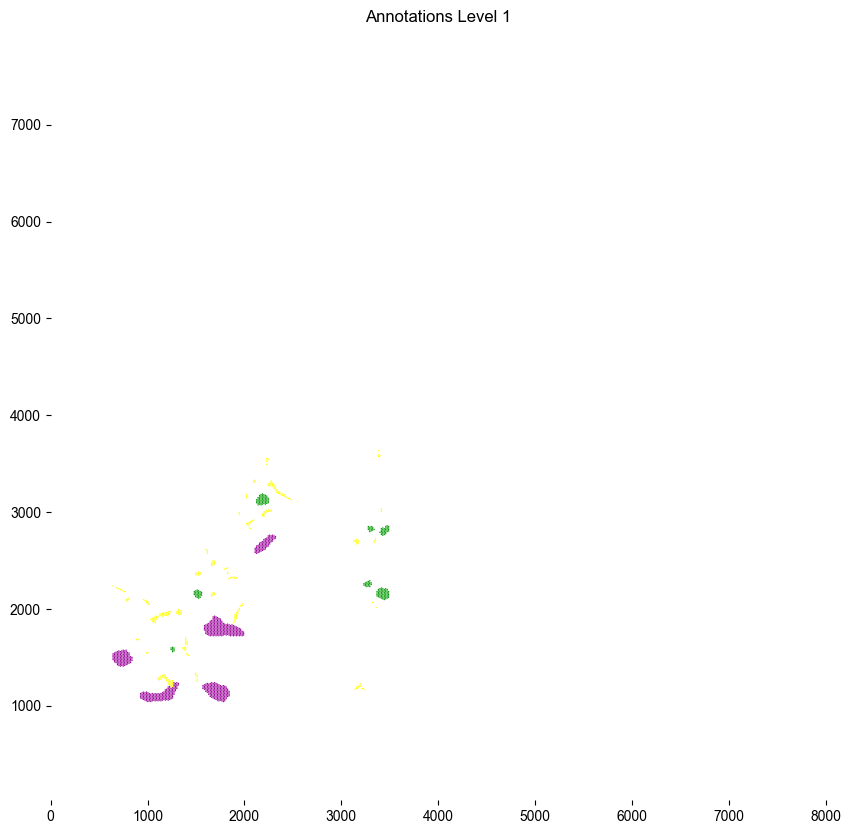

In [149]:
colors = df_ibex['annotation_lv_1'].map(lambda x: htsa_colormap['color_map'][x])
plt.figure(dpi=100, figsize=[10,10])
plt.scatter(df_ibex['x'], df_ibex['y'], c=colors, s=1, marker='o', rasterized=True, edgecolors='none')
plt.title('Annotations Level 1')
plt.axis('equal')
plt.xlim((0,8000))
plt.ylim((0,8000))

for pos in ['right', 'top', 'bottom', 'left']:
    plt.gca().spines[pos].set_visible(False)
# Uncomment the next line to save the figure
plt.savefig('paed_ibex_example_anno_level_1.png', dpi=150)
plt.show()

calculating distance matrix with cKDTree
Cortex
Edge
Medulla


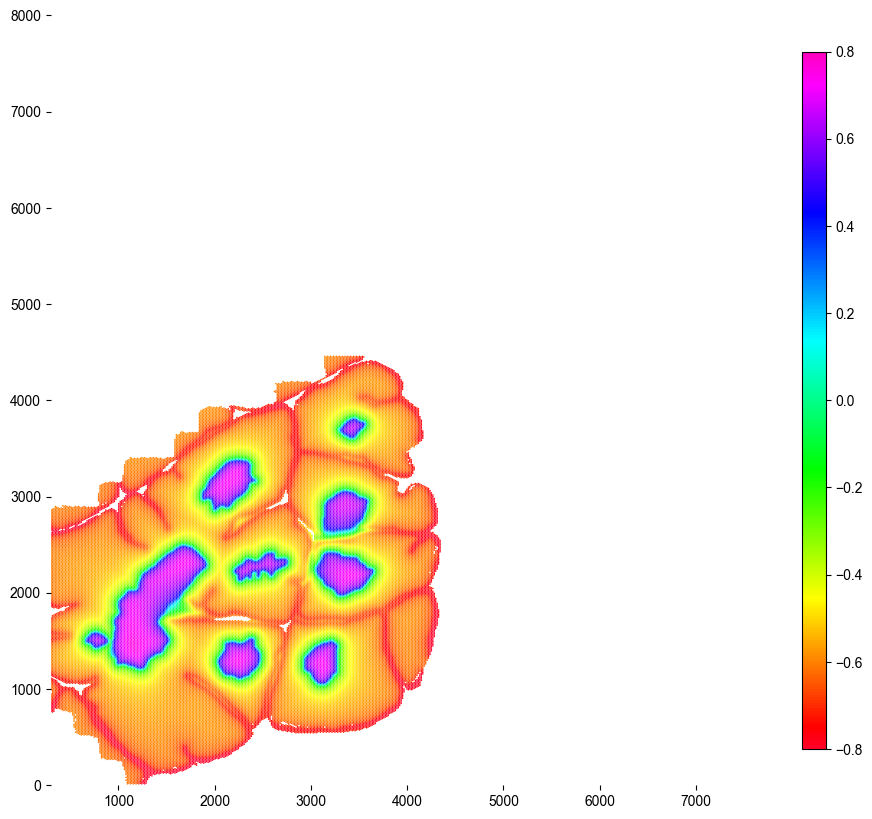

In [158]:
df_ibex = df_ibex.iloc[np.where(df_ibex['annotation_lv_0']!='unassigned')[0],:]
df_ibex = df_ibex.iloc[np.where(df_ibex['annotation_lv_0']!='Artifacts')[0],:]

tt.dist2cluster_fast(df_ibex,annotation='annotation_lv_0',KNN=10) # calculate minimum median distance of each spot to clusters with KNN
df_ibex = tt.calculate_axis_3p(df_ibex,anno='annotation_lv_0',structure=['Edge','Cortex','Medulla'],output_col='cma',w=[0.2,0.8])
# plotting 
plt.figure(dpi=100, figsize=[10,10])
plt.scatter(df_ibex['x'], df_ibex['y'], c=df_ibex['cma'], cmap='gist_rainbow', s=1.2, marker='o', vmin=-0.8, vmax=0.8, rasterized=True,edgecolors='none')
plt.axis('equal')
plt.xlim((0,8000))
plt.ylim((0,8000))
plt.colorbar(aspect=30,fraction=0.03)

for pos in ['right', 'top', 'bottom', 'left']:
    plt.gca().spines[pos].set_visible(False)
plt.savefig('ibex_paed_cma_knn_10.pdf',dpi=300)
plt.show()

# for supplementary 

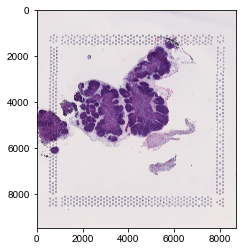

In [229]:
# load H&E image 
# remove background spots if you are not interested in it!
# df_fetal = df_fetal.iloc[np.where(df_fetal['annotations_level_0']!='Artifacts')[0],:]
# df_fetal = df_fetal.iloc[np.where(df_fetal['annotations_level_0']!='lymph')[0],:]
from PIL import Image 
fetal_hne,_,_ = tt.read_visium(path_fetal,res_in_ppm=1,plot=False)
plt.imsave(arr=fetal_hne,fname='fetal_hne.png',dpi=300)
plt.imshow(fetal_hne)

calculating distance matrix with cKDTree
Cortex
Edge
Medulla


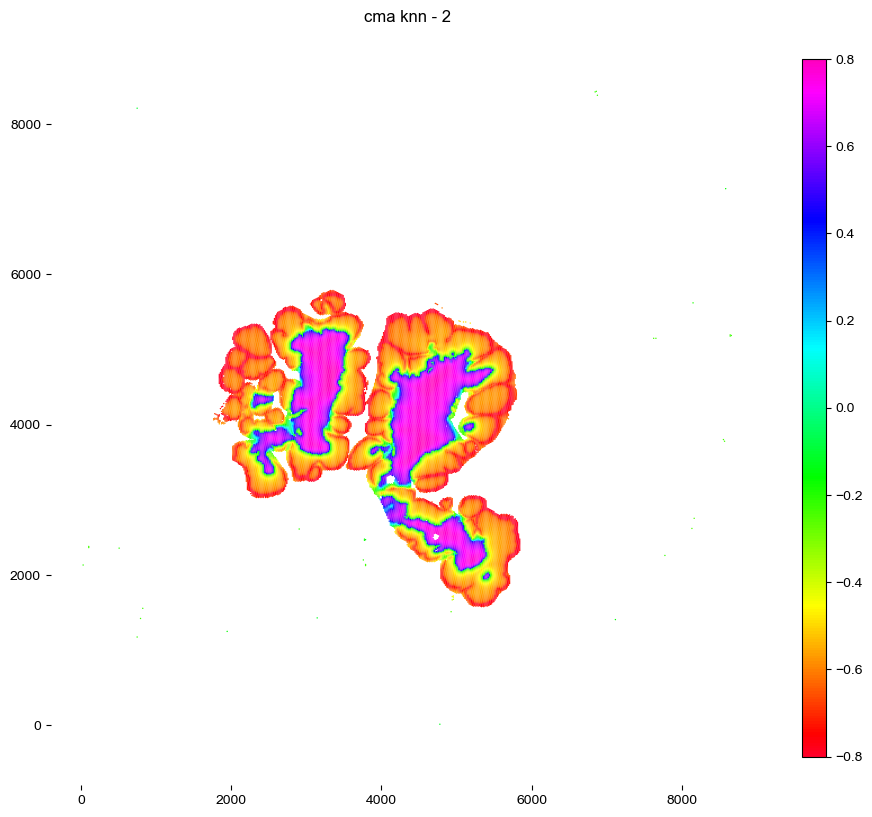

calculating distance matrix with cKDTree
Cortex
Edge
Medulla


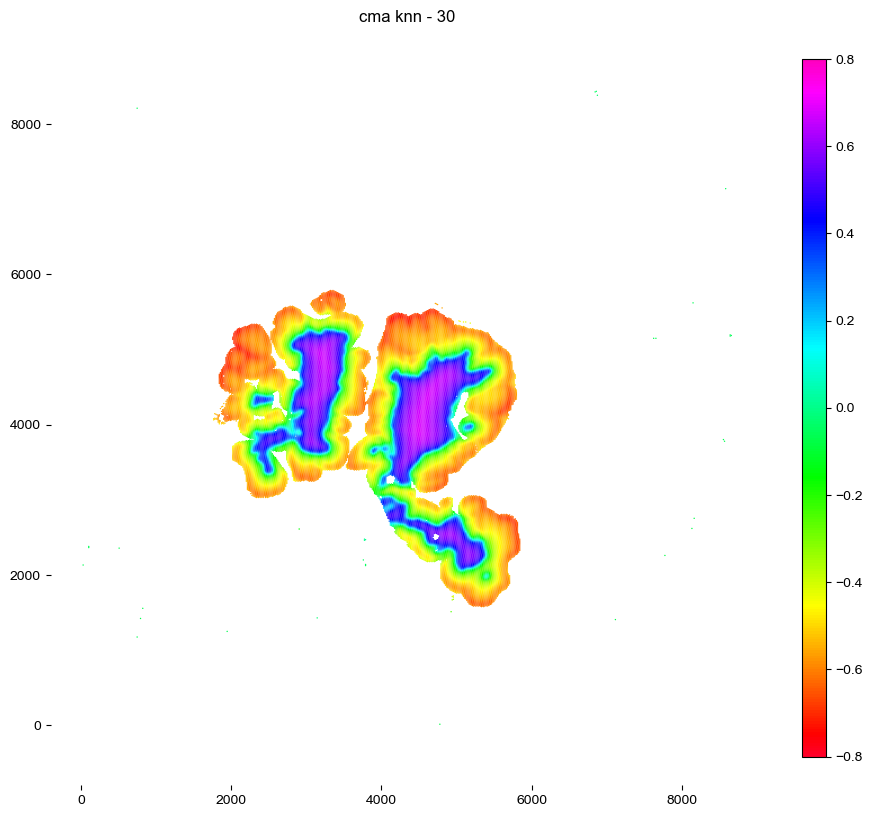

calculating distance matrix with cKDTree
Cortex
Edge
Medulla


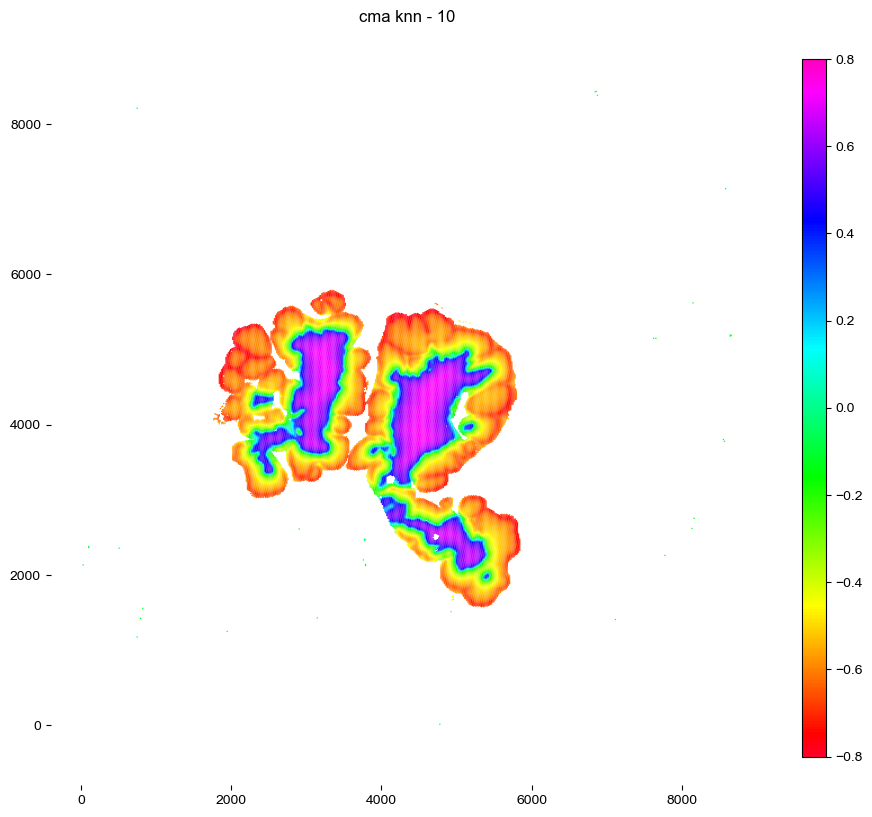

In [259]:
for K in [2,30,10]:
    tt.dist2cluster_fast(df_fetal,annotation='annotations_level_0',KNN=K) # calculate minimum median distance of each spot to clusters with KNN
    df_fetal = tt.calculate_axis_3p(df_fetal,anno='annotations_level_0',structure=['Edge','Cortex','Medulla'],output_col='cma',w=[0.2,0.8])
    # plotting 
    plt.figure(dpi=100, figsize=[10,10])
    plt.scatter(df_fetal['x'], df_fetal['y'], c=df_fetal['cma'], cmap='gist_rainbow', s=1, marker='o', vmin=-0.8, vmax=0.8, rasterized=True,edgecolors='none')
    plt.title('cma knn - '+str(K))
    plt.xlim((0,fetal_hne.shape[(0)]))
    plt.ylim((0,fetal_hne.shape[(1)]))
    plt.colorbar(aspect=30,fraction=0.03)
    plt.axis('equal')
    for pos in ['right', 'top', 'bottom', 'left']:
        plt.gca().spines[pos].set_visible(False)
    plt.savefig('fetal_cma_knn_'+str(K)+'.pdf',dpi=600)
    plt.show()

In [260]:
import seaborn as sns
ct_order = ['Capsular','Sub-Capsular','Cortical level 1','Cortical level 2','Cortical level 3','Cortical CMJ','Medullar CMJ','Medullar level 1','Medullar level 2','Medullar level 3']
ct_color_map = dict(zip(ct_order, np.array(sns.color_palette("tab20", len(ct_order)))[range(len(ct_order))]))
# binned axis
ct2_values = [-0.75,-0.62,-0.55,-0.45,-0.3,0.1,0.55,0.65,0.7]
df = tt.bin_axis(ct_order ,ct2_values,df_fetal,'cma')   
df.loc[df['annotations_level_0']=='Edge','manual_bin_cma'] = 'Capsular'
df['manual_bin_cma'].value_counts()

Capsular= (-0.75>cma)
Sub-Capsular= (-0.75<=cma) & (-0.62>cma)
Cortical level 1= (-0.62<=cma) & (-0.55>cma)
Cortical level 2= (-0.55<=cma) & (-0.45>cma)
Cortical level 3= (-0.45<=cma) & (-0.3>cma)
Cortical CMJ= (-0.3<=cma) & (0.1>cma)
Medullar CMJ= (0.1<=cma) & (0.55>cma)
Medullar level 1= (0.55<=cma) & (0.65>cma)
Medullar level 2= (0.65<=cma) & (0.7>cma)
Medullar level 3= (0.7=<cma)


manual_bin_cma
Capsular            9030
Cortical level 1    5445
Cortical level 2    5085
Medullar CMJ        4715
Medullar level 1    3365
Cortical level 3    3320
Sub-Capsular        2892
Cortical CMJ        2887
Medullar level 2    2435
Medullar level 3    1331
Name: count, dtype: int64

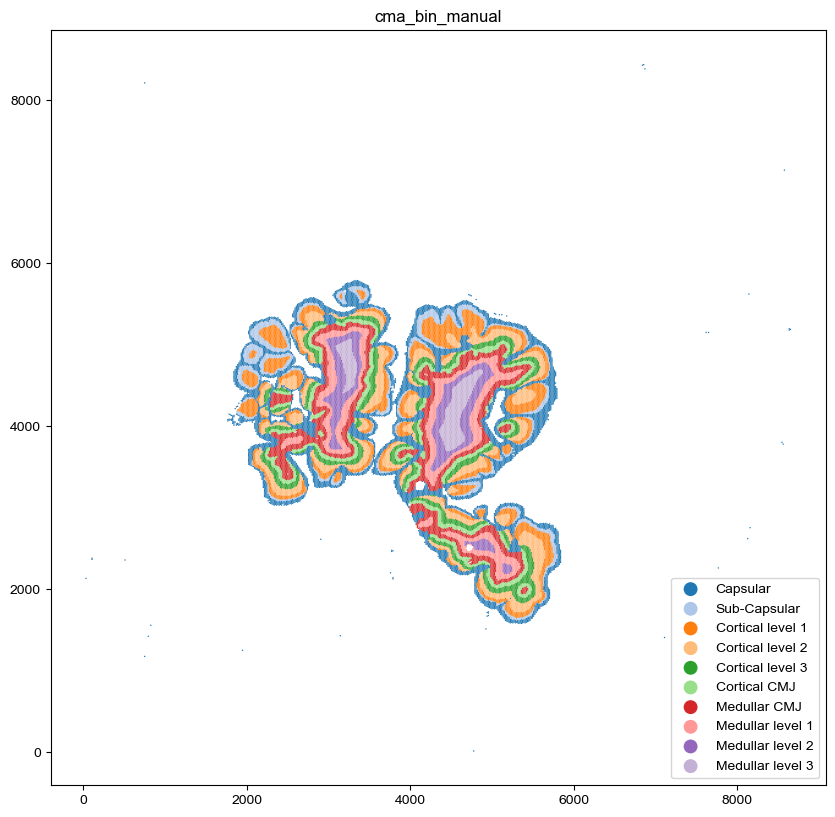

In [262]:

# Prepare your figure and axis
plt.figure(dpi=100, figsize=[10,10])

# Unique categories in 'manual_bin_cma'
categories = df_fetal['manual_bin_cma'].unique()

# Loop through categories to plot each subset of the data with its color
for category in categories:
    # Subset the DataFrame based on the category
    subset = df_fetal[df_fetal['manual_bin_cma'] == category]
    
    # Plot each subset with its corresponding color
    # Note: 'ct_color_map' maps categories to colors
    plt.scatter(subset['x'], subset['y'], s=1, color=ct_color_map[category], label=category,rasterized=True,edgecolors='none', marker='o')

plt.grid(False)
plt.title('cma_bin_manual')
plt.axis('equal')

# Optionally add a legend if you want to label the categories
plt.legend(markerscale=10)  # Adjust the markerscale for better visibility of the legend markers

# Save the figure
plt.savefig('fetal_cma_bins_matplotlib.pdf', dpi=600)

# Display the plot
plt.show()



## load and transfer annotations to grid space - paed

In [234]:
df_paed = tt.anno_to_grid(
    folder=path_paed+'/tissue_annotations/',
    file_name = 'annotations_level_0',
    spot_diameter = 15,
    load_colors=True,
)

loaded annotation image - annotations_level_0 size - (4121, 4644)
loaded annotations
{1: 'unassigned', 2: 'Cortex', 3: 'Medulla', 4: 'Edge', 5: 'Artifacts'}
loaded ppm
{'ppm': 0.5}
loaded color annotations
{'unassigned': 'yellow', 'Cortex': 'cyan', 'Medulla': 'green', 'Edge': 'brown', 'Artifacts': 'black'}
generating grid with spot size - 15, with resolution of - 0.5 ppm
annotations_level_0


340380it [01:31, 3738.10it/s]


In [235]:
# remove background spots if you are not interested in it!
df_paed = df_paed.iloc[np.where(df_paed['annotations_level_0']!='unassigned')[0],:]
df_paed = df_paed.iloc[np.where(df_paed['annotations_level_0']!='Artifacts')[0],:]

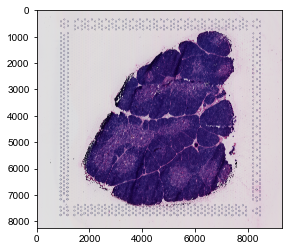

In [236]:
# load H&E image 
from PIL import Image 
paed_hne,_,_ = tt.read_visium(path_paed+'/',res_in_ppm=1,plot=False)
plt.imsave(arr=paed_hne,fname='paed_hne.png',dpi=300)
plt.imshow(paed_hne)

calculating distance matrix with cKDTree
Cortex
Edge
Medulla


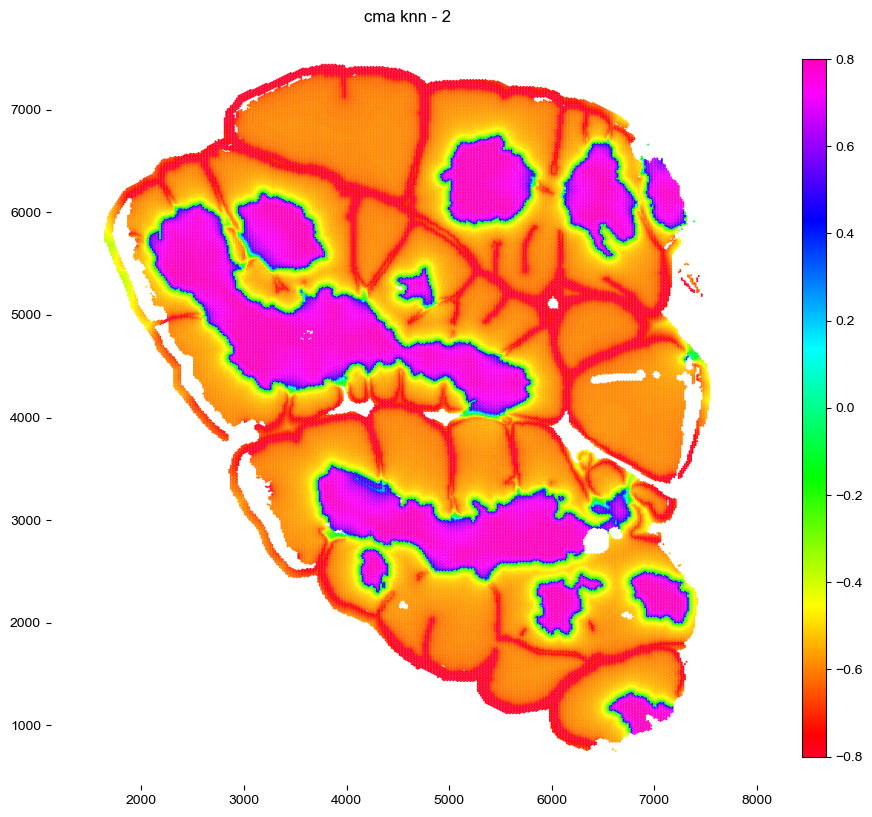

calculating distance matrix with cKDTree
Cortex
Edge
Medulla


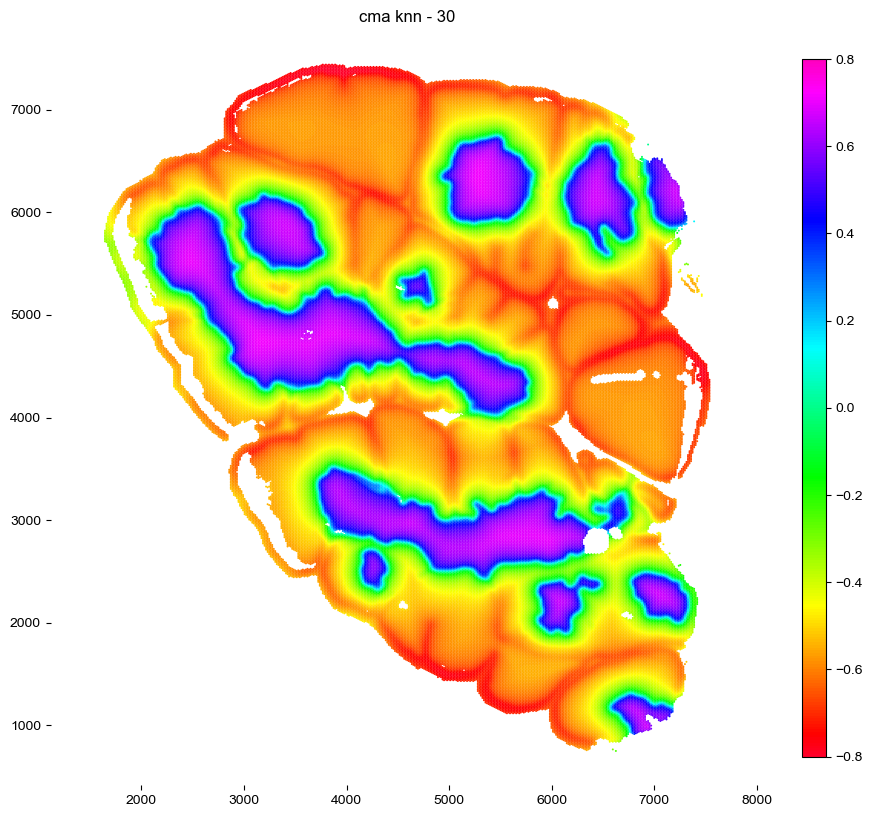

calculating distance matrix with cKDTree
Cortex
Edge
Medulla


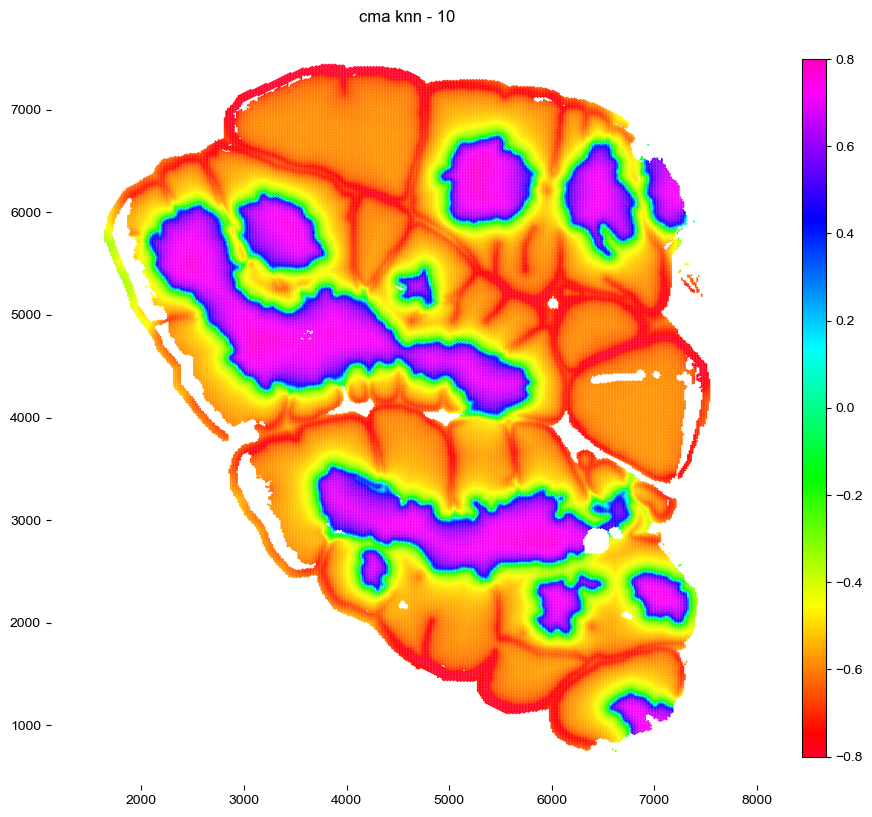

In [245]:
for K in [2,30,10]:
    tt.dist2cluster_fast(df_paed,annotation='annotations_level_0',KNN=K) # calculate minimum median distance of each spot to clusters with KNN
    df_paed = tt.calculate_axis_3p(df_paed,anno='annotations_level_0',structure=['Edge','Cortex','Medulla'],output_col='cma',w=[0.2,0.8])
    # plotting 
    plt.figure(dpi=100, figsize=[10,10])
    plt.scatter(df_paed['x'], df_paed['y'], c=df_paed['cma'], cmap='gist_rainbow', s=2, marker='o', vmin=-0.8, vmax=0.8, rasterized=True,edgecolors='none')
    plt.title('cma knn - '+str(K))
    plt.xlim((0,paed_hne.shape[(0)]))
    plt.ylim((0,paed_hne.shape[(1)]))
    plt.colorbar(aspect=30,fraction=0.03)
    plt.axis('equal')
    for pos in ['right', 'top', 'bottom', 'left']:
        plt.gca().spines[pos].set_visible(False)
    plt.savefig('paed_cma_knn_'+str(K)+'.pdf',dpi=600)
    plt.show()

In [239]:
import seaborn as sns
ct_order = ['Capsular','Sub-Capsular','Cortical level 1','Cortical level 2','Cortical level 3','Cortical CMJ','Medullar CMJ','Medullar level 1','Medullar level 2','Medullar level 3']
ct_color_map = dict(zip(ct_order, np.array(sns.color_palette("tab20", len(ct_order)))[range(len(ct_order))]))
# binned axis
ct2_values = [-0.75,-0.62,-0.55,-0.45,-0.3,0.1,0.55,0.65,0.7]
df = tt.bin_axis(ct_order ,ct2_values,df_paed,'cma')   
df.loc[df['annotations_level_0']=='Edge','manual_bin_cma'] = 'Capsular'
df['manual_bin_cma'].value_counts()

Capsular= (-0.75>cma)
Sub-Capsular= (-0.75<=cma) & (-0.62>cma)
Cortical level 1= (-0.62<=cma) & (-0.55>cma)
Cortical level 2= (-0.55<=cma) & (-0.45>cma)
Cortical level 3= (-0.45<=cma) & (-0.3>cma)
Cortical CMJ= (-0.3<=cma) & (0.1>cma)
Medullar CMJ= (0.1<=cma) & (0.55>cma)
Medullar level 1= (0.55<=cma) & (0.65>cma)
Medullar level 2= (0.65<=cma) & (0.7>cma)
Medullar level 3= (0.7=<cma)


manual_bin_cma
Cortical level 1    26541
Capsular            17715
Cortical level 2    16278
Sub-Capsular        10488
Cortical level 3     9659
Medullar CMJ         7506
Medullar level 3     7382
Cortical CMJ         7096
Medullar level 1     6331
Medullar level 2     6181
Name: count, dtype: int64

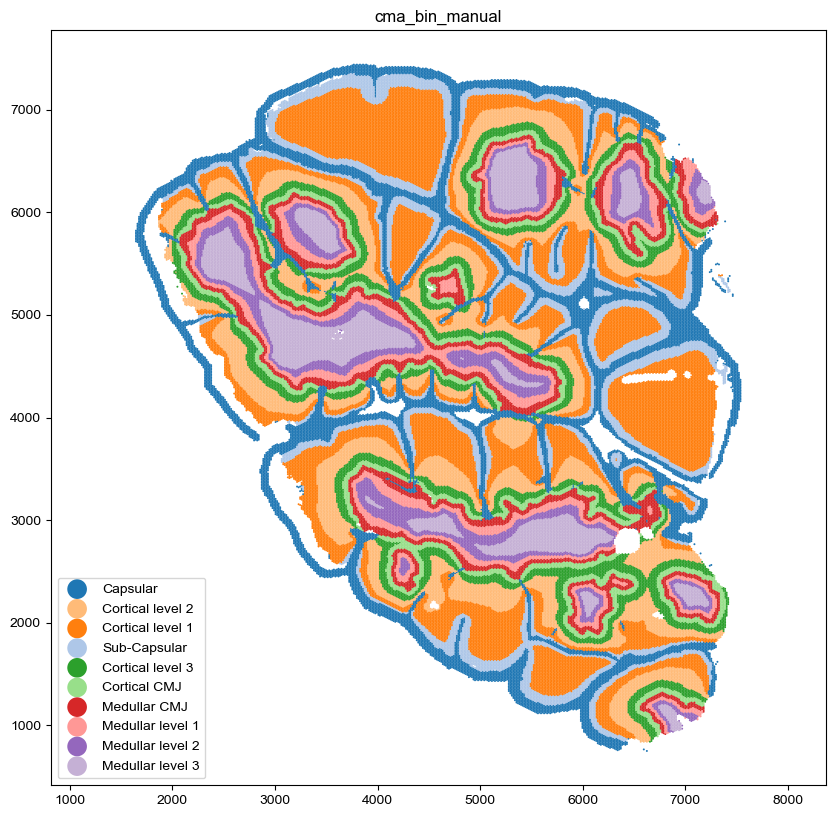

In [253]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Assuming df_paed is your DataFrame and it's already loaded
# Assuming 'manual_bin_cma' is a categorical column in df_paed
# ct_order and ct_color_map are as previously defined

# Prepare your figure and axis
plt.figure(dpi=100, figsize=[10,10])

# Unique categories in 'manual_bin_cma'
categories = df_paed['manual_bin_cma'].unique()

# Loop through categories to plot each subset of the data with its color
for category in categories:
    # Subset the DataFrame based on the category
    subset = df_paed[df_paed['manual_bin_cma'] == category]
    
    # Plot each subset with its corresponding color
    # Note: 'ct_color_map' maps categories to colors
    plt.scatter(subset['x'], subset['y'], s=2, color=ct_color_map[category], label=category,rasterized=True,edgecolors='none', marker='o')

plt.grid(False)
plt.title('cma_bin_manual')
plt.axis('equal')

# Optionally add a legend if you want to label the categories
plt.legend(markerscale=10)  # Adjust the markerscale for better visibility of the legend markers

# Save the figure
plt.savefig('paed_cma_bins_matplotlib.pdf', dpi=600)

# Display the plot
plt.show()


# simulation data - this code was constructed with aid of ChatGPT4 

In [1]:
# Adjusting the axes to have the same scales for x and y, and ensuring that the random spots strictly adhere to the grid boundaries
import numpy as np

def plot_Hx_vs_y_density(ax, spots, H_values):
    """
    Plot H(x) vs Y for different grid densities on the given Axes object.

    Parameters:
    - ax: The matplotlib Axes object where the plot will be drawn.
    - spots: A list of tuples, each representing the (x, y) coordinates of a spot.
    - H_values: A list of H(x) values corresponding to each spot.
    """
    # Scatter plot of H(x) values against the Y coordinates of the spots
    scatter = ax.scatter([s[1] for s in spots], H_values, c=H_values, cmap='gist_rainbow', s=10)
    ax.set_ylim([-1, 1])  # Set the Y axis limits to ensure all f(x) values are within the plot
    ax.set_yticks(np.arange(-1, 1.1, 0.2))  # Setting tick marks for clarity
    ax.set_xlabel('Y Coordinate')  # Label for the X axis (actually Y coordinate of the spot)
    ax.set_ylabel('H(x) Value')  # Label for the Y axis
    ax.grid(True)  # Enable grid for better readability
    
    return scatter


def Mu_S_K(spot, grid_points, num_points):
    """
    Calculate the average distance from the spot to the nearest num_points in the grid.
    
    Parameters:
    - spot: A tuple representing the (x, y) coordinates of the spot.
    - grid_points: A list of tuples, each representing the (x, y) coordinates of a grid point.
    - num_points: The number of nearest points to consider for averaging.
    
    Returns:
    The average distance from the spot to its nearest num_points grid points.
    """
    D_s_p = [np.sqrt((spot[0] - p[0])**2 + (spot[1] - p[1])**2) for p in grid_points]
    return np.mean(sorted(D_s_p)[:num_points])

def  calculate_H_values(spots, grid_structure_1, grid_structure_2, K):
    """
    Calculate the f(x) values for a set of spots based on their distances to two structures.
    
    Parameters:
    - spots: A list of tuples, each representing the (x, y) coordinates of a spot.
    - grid_structure_1: A list of tuples for the grid points of Structure 1.
    - grid_structure_2: A list of tuples for the grid points of Structure 2.
    - K: The number of nearest points to consider for each structure.
    
    Returns:
    A list of f(x) values for each spot.
    """
    H_values = []
    for spot in spots:
        x1 = Mu_S_K(spot, grid_structure_1, K)
        x2 = Mu_S_K(spot, grid_structure_2, K)
        H = (x1 - x2) / (x1 + x2) if (x1 + x2) != 0 else 0  # Prevent division by zero
        H_values.append(H)
    return H_values


from numpy import random
def generate_grid(x_start, y_start, rows, cols, spacing):
    """
    Generate a grid of points.

    Parameters:
    - x_start: The starting x-coordinate of the grid.
    - y_start: The starting y-coordinate of the grid.
    - rows: The number of rows in the grid.
    - cols: The number of columns in the grid.
    - spacing: The distance between adjacent points in the grid.

    Returns:
    A list of tuples, where each tuple represents the (x, y) coordinates of a point in the grid.
    """
    grid = []
    for row in range(rows):
        for col in range(cols):
            x = x_start + col * spacing
            y = y_start + row * spacing
            grid.append((x, y))
    return grid


def analyze_and_plot_corrected_density_equal_axes(ax_main, ax_fx_vs_y, rows, cols, K=10,):
    """Analyze and plot for corrected grid densities with equal axes and spot positions."""
    spacing_x = 5.0 / cols  # Total width is 5
    spacing_y = 10.0 / (2 * rows)  # Total height is 10
    grid_structure_1 = generate_grid(0, 0, rows, cols, spacing_x)
    grid_structure_2 = generate_grid(0, rows * spacing_y, rows, cols, spacing_x)
    x_max = (cols - 1) * spacing_x  # Adjusted for grid points count
    y_max = rows * spacing_y * 2 - spacing_y  # Adjusted for grid points count
    spots = [(random.uniform(0, x_max), random.uniform(0, y_max)) for _ in range(500)]
    H_values =  calculate_H_values(spots, grid_structure_1, grid_structure_2, K)

    # Main scatter plot with equal axes
    ax_main.scatter([p[0] for p in grid_structure_1], [p[1] for p in grid_structure_1], c='black', marker='o')
    ax_main.scatter([p[0] for p in grid_structure_2], [p[1] for p in grid_structure_2], c='black', marker='^')
    ax_main.scatter([s[0] for s in spots], [s[1] for s in spots], c=H_values, cmap='gist_rainbow', s=50)
    ax_main.set_title(f'Grid Density: {rows}x{cols}, KNN = {K}')
    ax_main.set_xlim(0, 5)  # Adjusting x-axis limit
    ax_main.set_ylim(0, 10) # Adjusting y-axis limit
    ax_main.set_aspect('equal', adjustable='box')  # Equal scaling
    ax_main.grid(True)

    # f(x) vs Y plot
    plot_Hx_vs_y_density(ax_fx_vs_y, spots, H_values)

    

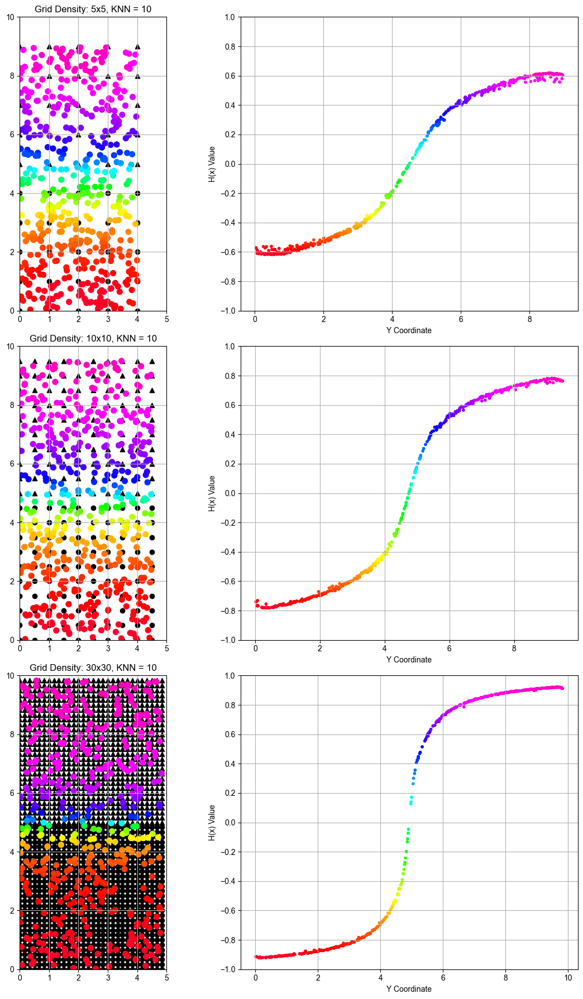

In [5]:
# Plotting with corrected grid densities, spot positions, and equal axes
fig, axes = plt.subplots(3, 2, figsize=(12, 18))

# 5x5 grid
analyze_and_plot_corrected_density_equal_axes(axes[0, 0], axes[0, 1], 5, 5, 10)

# 10x10 grid
analyze_and_plot_corrected_density_equal_axes(axes[1, 0], axes[1, 1], 10, 10, 10)

# 30x30 grid
analyze_and_plot_corrected_density_equal_axes(axes[2, 0], axes[2, 1], 30, 30, 10)

plt.tight_layout()
plt.savefig('simulated_grid_fixed_K.pdf', dpi=300)

plt.show()

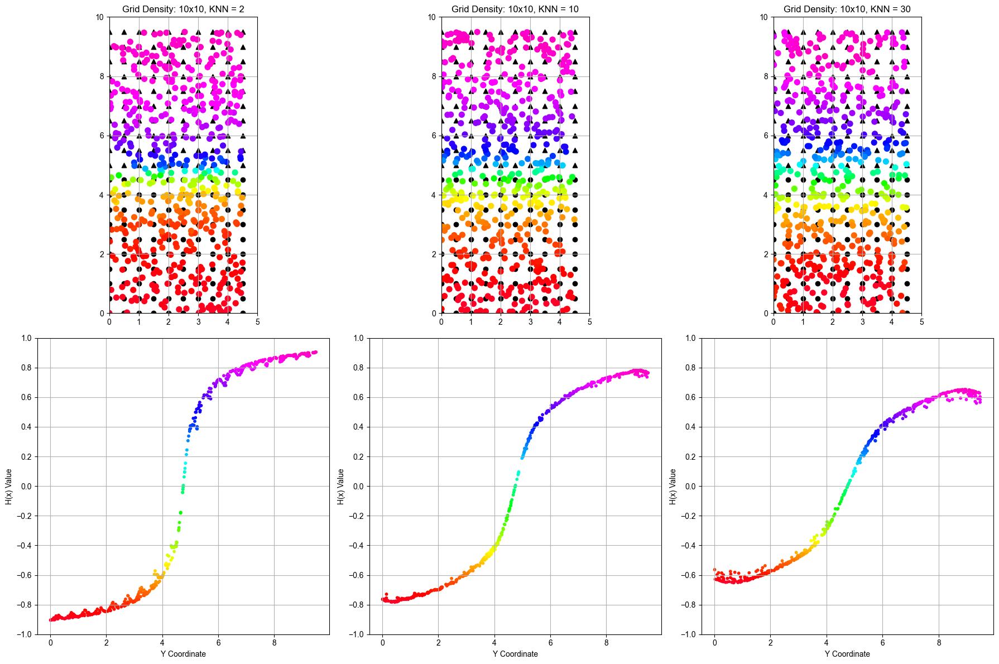

In [6]:
# Plotting with corrected grid densities, spot positions, and equal axes
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# 5x5 grid
analyze_and_plot_corrected_density_equal_axes(axes[0, 0], axes[1, 0], 10, 10, 2)

# 10x10 grid
analyze_and_plot_corrected_density_equal_axes(axes[0, 1], axes[1, 1], 10, 10, 10)

# 30x30 grid
analyze_and_plot_corrected_density_equal_axes(axes[0, 2], axes[1, 2], 10, 10, 30)

plt.tight_layout()
plt.savefig('simulated_K_fixed_grid_10.pdf', dpi=300)

plt.show()

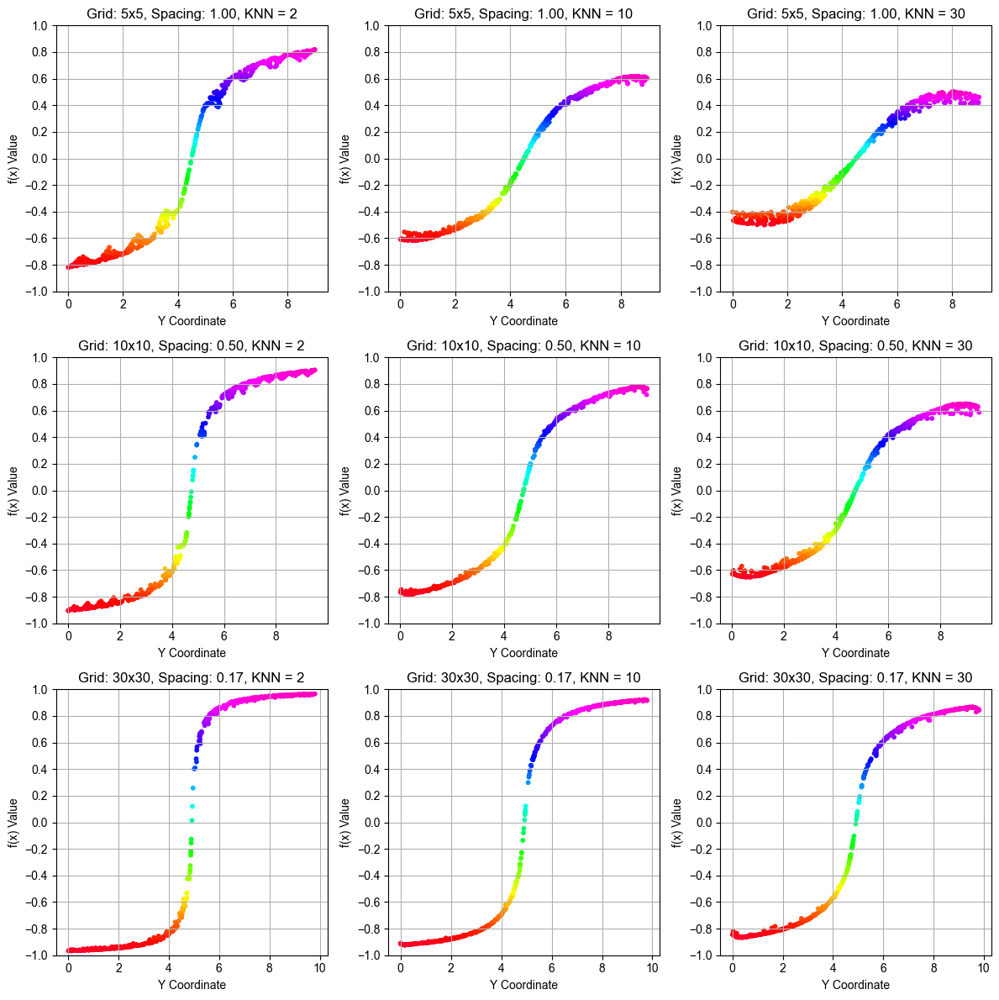

In [7]:
# Adjusting the titles to display numbers with only two decimal places
# Creating a 3x3 matrix plot of just the f(x) to Y graphs with different K values and grid densities

K_values = [2, 10, 30]
grid_densities = [(5, 1), (10, 0.5), (30, 0.5/3)]  # (cols, spacing)

fig, axes = plt.subplots(3, 3, figsize=(12, 12))

for row, (cols, spacing) in enumerate(grid_densities):
    for col, K in enumerate(K_values):
        # Generating grids and calculating f(x)
        grid_structure_1 = generate_grid(0, 0, cols, cols, spacing)
        grid_structure_2 = generate_grid(0, cols * spacing, cols, cols, spacing)
        x_max = (cols - 1) * spacing
        y_max = 2 * cols * spacing - spacing
        spots = [(random.uniform(0, x_max), random.uniform(0, y_max)) for _ in range(500)]
        H_values =  calculate_H_values(spots, grid_structure_1, grid_structure_2, K)

        # f(x) vs Y plot with adjusted title
        axes[row, col].scatter([s[1] for s in spots], H_values, c=H_values, cmap='gist_rainbow', s=10)
        axes[row, col].set_ylim([-1, 1])
        axes[row, col].set_yticks(np.arange(-1, 1.1, 0.2))
        axes[row, col].set_xlabel('Y Coordinate')
        axes[row, col].set_ylabel('f(x) Value')
        axes[row, col].grid(True)
        axes[row, col].set_title(f'Grid: {cols}x{cols}, Spacing: {spacing:.2f}, KNN = {K}')

plt.tight_layout()
plt.savefig('simulated_grid_and_K.pdf', dpi=300)

plt.show()


In [1]:
# show plots on visium sample resolution 

In [5]:
adata_fet = sc.read_h5ad(path_fetal+'/adata_cma_v2.h5ad')
adata_fet

/home/jovyan/my-conda-envs/tissue_tag/lib/python3.9/site-packages/anndata/_core/anndata.py:1899: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 1162 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'y', 'x', 'annotations_level_0', 'annotations_level_0_number', 'annotations_level_1', 'annotations_level_1_number', 'annotations_lobules_0', 'annotations_lobules_0_number', 'L2_dist_annotations_level_0_Artifacts', 'L2_dist_annotations_level_0_Cortex', 'L2_dist_annotations_level_0_Edge', 'L2_dist_annotations_level_0_Medulla', 'L2_dist_annotations_level_0_lymph', 'L2_dist_annotations_level_1_PVS', 'L2_dist_annotations_level_1_unassigned', 'cma_v2', 'manual_bin_cma_v2', 'manual_bin_cma_v2_int'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'annotations_level_0_colors', 'annotations_level_1_colors', 'annotations_lobules_0_colors', 'manual_bin_cma_v2_colors', 'spatial'
    obsm: 'spatial'

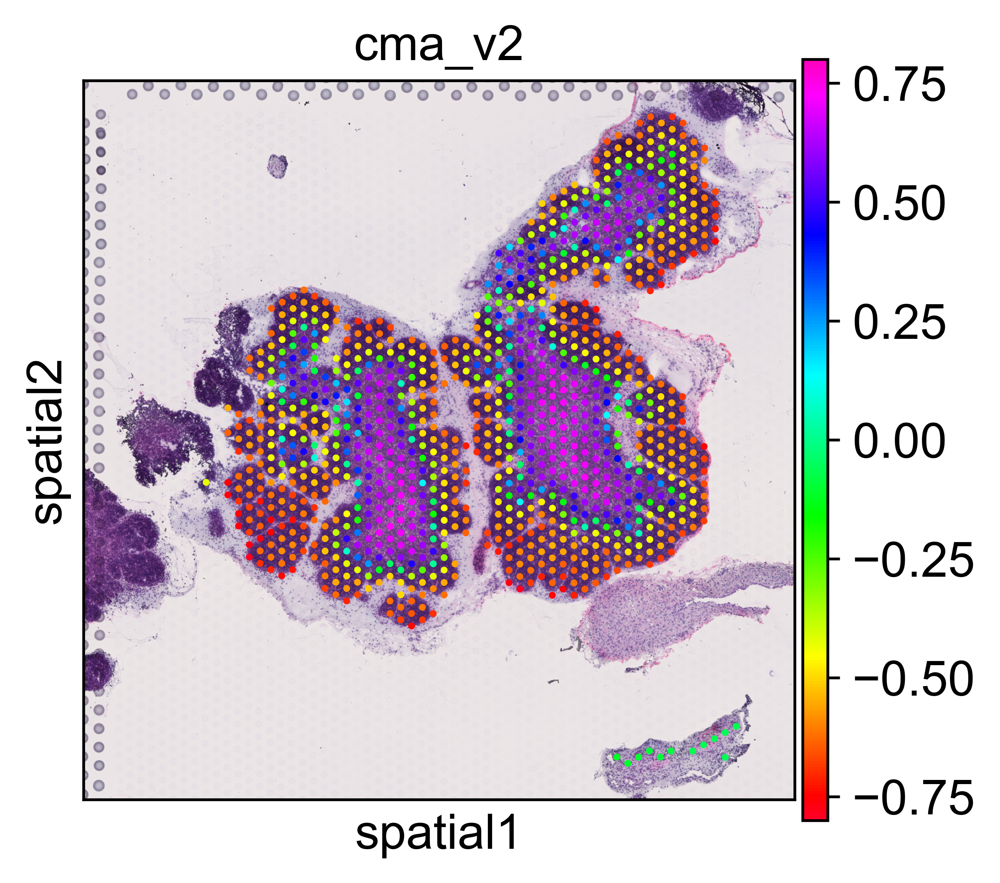

In [17]:
sc.set_figure_params(dpi=300)
sc.pl.spatial(adata_fet,color='cma_v2',cmap='gist_rainbow',vmin=-0.8,vmax=0.8,save='_fetal_cma_example.png')

In [9]:
adata_paed = sc.read_h5ad(path_paed+'/adata_cma_v2.h5ad')
adata_paed

/home/jovyan/my-conda-envs/tissue_tag/lib/python3.9/site-packages/anndata/_core/anndata.py:1899: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 2963 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'y', 'x', 'annotations_level_0', 'annotations_level_0_number', 'annotations_level_1', 'annotations_level_1_number', 'annotations_lobules_0', 'annotations_lobules_0_number', 'L2_dist_annotations_level_0_Artifacts', 'L2_dist_annotations_level_0_Cortex', 'L2_dist_annotations_level_0_Edge', 'L2_dist_annotations_level_0_Medulla', 'L2_dist_annotations_level_1_HS', 'L2_dist_annotations_level_1_PVS', 'L2_dist_annotations_level_1_unassigned', 'L2_dist_annotations_level_1_vessels', 'cma_v2', 'manual_bin_cma_v2', 'manual_bin_cma_v2_int'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'annotations_level_0_colors', 'annotations_level_1_colors', 'annotations_lobules_0_colors', 'manual_bin_cma_v2_colors', 'spatial'
    obsm: 'spatial'

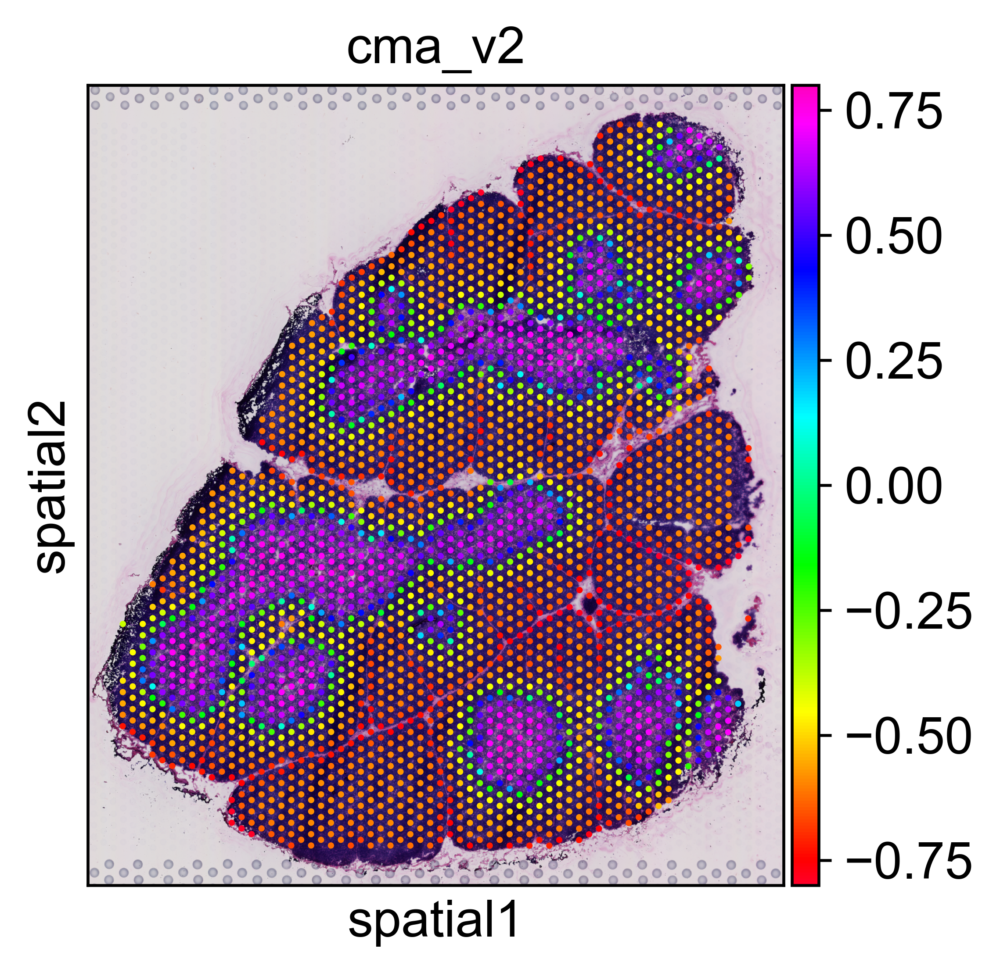

In [16]:
adata_paed = adata_paed[adata_paed.obs['annotations_level_0'] != 'Artifacts']
sc.pl.spatial(adata_paed,color='cma_v2',cmap='gist_rainbow',vmin=-0.8,vmax=0.8,save='_paed_cma_example.png')

In [13]:
adata_paed.obs['annotations_level_0'].value_counts()

annotations_level_0
Cortex       1791
Medulla       724
Edge          328
Artifacts     120
Name: count, dtype: int64